In [1]:
load("segdf-Rintro-Ch5.RData")

In [4]:
summary(seg.df)

      age           gender        income            kids        ownHome   
 Min.   :19.26   Female:157   Min.   : -5183   Min.   :0.00   ownNo :159  
 1st Qu.:33.01   Male  :143   1st Qu.: 39656   1st Qu.:0.00   ownYes:141  
 Median :39.49                Median : 52014   Median :1.00               
 Mean   :41.20                Mean   : 50937   Mean   :1.27               
 3rd Qu.:47.90                3rd Qu.: 61403   3rd Qu.:2.00               
 Max.   :80.49                Max.   :114278   Max.   :7.00               
  subscribe         Segment   
 subNo :260   Moving up : 70  
 subYes: 40   Suburb mix:100  
              Travelers : 80  
              Urban hip : 50  
                              
                              

### Testing Group Frequencies: chisq.test()

One of the simplest statistical tests is the chi-square test, which is used with fre- quency counts such as those produced by table. A chi-square test determines whether the frequencies in cells are significantly different from what one would expect on the basis of their total counts.

In [2]:
chisq.test(table(seg.df$Segment))


	Chi-squared test for given probabilities

data:  table(seg.df$Segment)
X-squared = 17.333, df = 3, p-value = 0.0006035


Is subscription status independent from home ownership, as we hypothesized when we plotted the data in Sect. 5.2? That is, in our simulated data, are respondents just as likely to subscribe or not, without regard to home ownership status (and conversely, are they just as likely to own a home or not, independent of subscription status)? We construct a two-way table and test it:

Based on the high p-value, we cannot reject the null hypothesis, and conclude that the factors are unrelated and that home ownership is independent of subscription status in our data.

In [5]:
table(seg.df$subscribe, seg.df$ownHome)

        
         ownNo ownYes
  subNo    137    123
  subYes    22     18

In [6]:
chisq.test(table(seg.df$subscribe, seg.df$ownHome))


	Pearson's Chi-squared test with Yates' continuity correction

data:  table(seg.df$subscribe, seg.df$ownHome)
X-squared = 0.010422, df = 1, p-value = 0.9187


First, for 2×2 tables, chisq.test() defaults to using Yates’ correction, which adjusts the chi-square statistic in light of the fact that the assumption of continuous data is imperfect when data comes from a lumpy binomial distribution.

In [7]:
chisq.test(table(seg.df$subscribe, seg.df$ownHome), correct=FALSE)


	Pearson's Chi-squared test

data:  table(seg.df$subscribe, seg.df$ownHome)
X-squared = 0.074113, df = 1, p-value = 0.7854


Second, chisq.test() can calculate confidence intervals using a simulation method, where it compares the observed table to thousands of simulated tables with the same marginal counts. The p-value indicates the proportion of those simulations with differences between the cell counts and marginal proportions at least as large as the ones in the observed table. We do that for 10,000 simulations using the sim and B arguments as follows:

In [8]:
chisq.test(table(seg.df$subscribe, seg.df$ownHome), sim=TRUE, B=10000)


	Pearson's Chi-squared test with simulated p-value (based on 10000
	replicates)

data:  table(seg.df$subscribe, seg.df$ownHome)
X-squared = 0.074113, df = NA, p-value = 0.8623


### Testing Observed Proportions: binom.test()

Our definition of a 95 % confidence interval is this: it is the range of possible estimates that we would expect to see 95 % of the time if we repeatedly estimate a statistic using random samples of the same sample size under the assumption that the true value in an infinite or very large population is the same as our current estimate. 

In [12]:
sum(dbinom(8:12, 20, 0.5))

[1] 0.736824

### Testing Group Means: t.test()

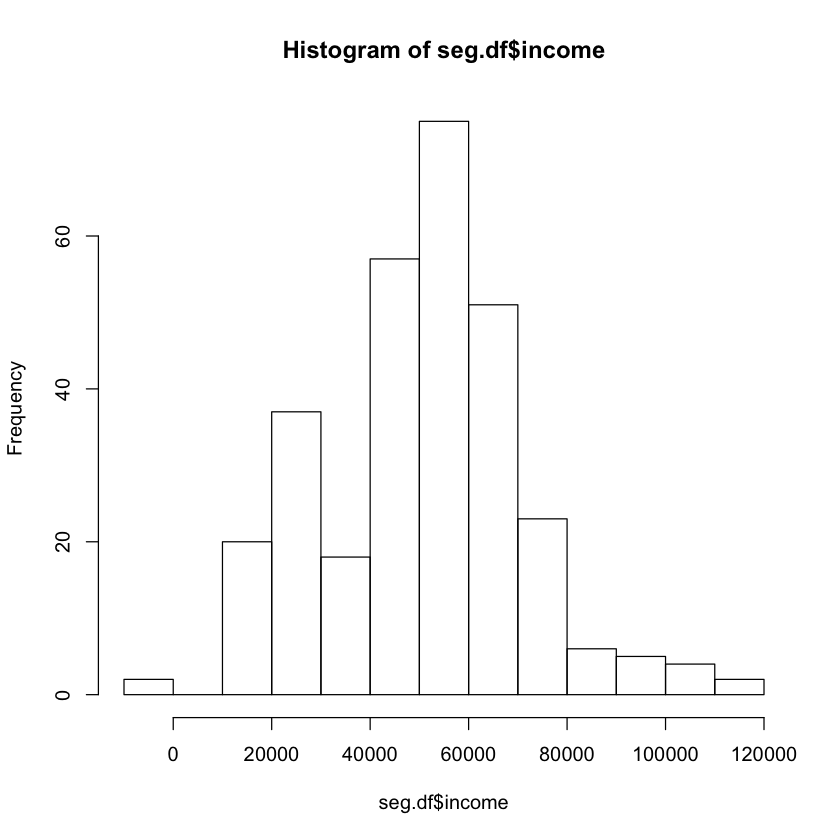

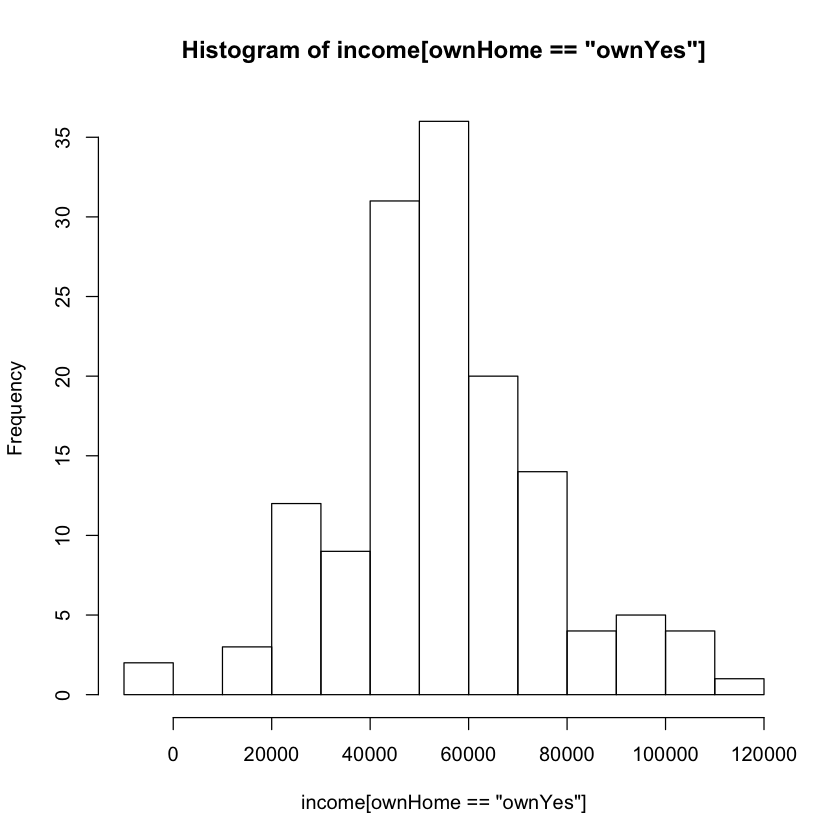

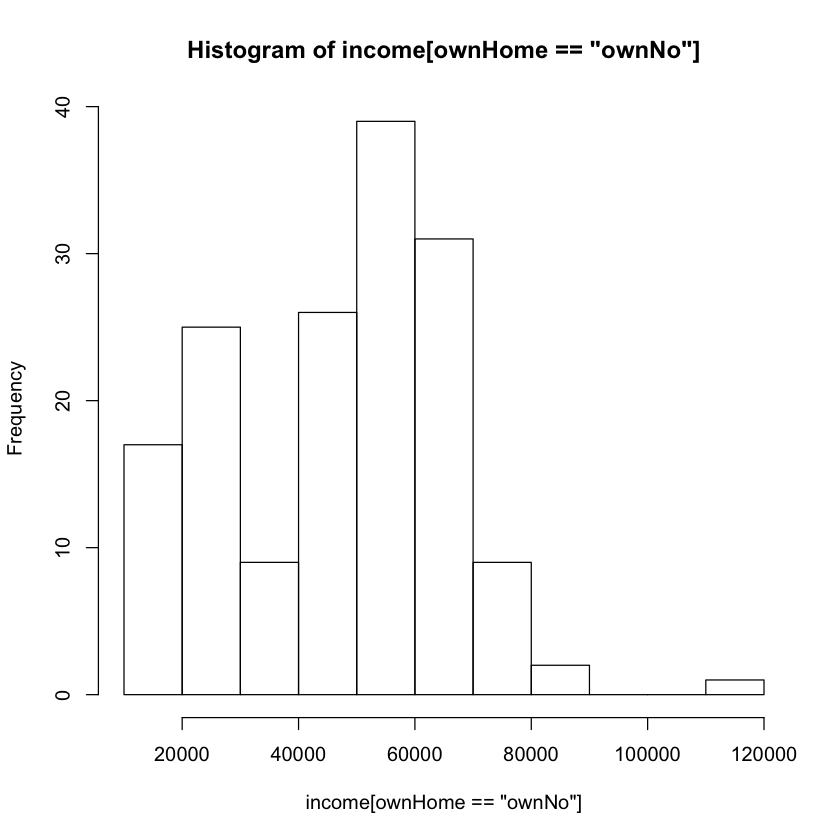

In [9]:
hist(seg.df$income)  # not shown
with(seg.df, hist(income[ownHome=="ownYes"]))  # not shown
with(seg.df, hist(income[ownHome=="ownNo"]))   # not shown

In [11]:
t.test(income ~ ownHome, data=seg.df)


	Welch Two Sample t-test

data:  income by ownHome
t = -3.2731, df = 285.25, p-value = 0.001195
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -12080.155  -3007.193
sample estimates:
 mean in group ownNo mean in group ownYes 
            47391.01             54934.68 


In [13]:
t.test(income ~ ownHome, data=subset(seg.df, Segment=="Travelers"))


	Welch Two Sample t-test

data:  income by ownHome
t = 0.26561, df = 53.833, p-value = 0.7916
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -8508.993 11107.604
sample estimates:
 mean in group ownNo mean in group ownYes 
            63188.42             61889.12 


### Testing Multiple Group Means: ANOVA

In [14]:
seg.aov.own <- aov(income ~ ownHome, data=seg.df) 
anova(seg.aov.own)

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
ownHome,1,4252661211,4252661211,10.83174,0.001117655
Residuals,298,116998087011,392611030,NA,NA


In [15]:
seg.aov.seg <- aov(income ~ Segment, data=seg.df) 
anova(seg.aov.seg)

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
Segment,3,54969675428,18323225143,81.82841,1.409305e-38
Residuals,296,66281072794,223922543,NA,NA


In [16]:
anova(aov(income ~ Segment + ownHome, data=seg.df))

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
Segment,3,54969675428,18323225143,81.63808,1.773744e-38
ownHome,1,69918004,69918004,0.3115157,0.5771749
Residuals,295,66211154791,224444593,NA,NA


The results indicate that when we try to explain income differences in income by both Segment and ownHome, segment is a significant predictor (p ≪ 0.01) but home ownership is not a significant predictor. Yet the previous results said that it was significant. What’s the difference? What is happening is that segment and home ownership are not independent, and the effect is captured sufficiently by segment membership alone. Home ownership accounts for little more over and above what can be explained by Segment.

In [17]:
anova(aov(income ~ Segment * ownHome, data=seg.df))

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
Segment,3,54969675428,18323225143,81.13047,3.35888e-38
ownHome,1,69918004,69918004,0.3095787,0.5783649
Segment:ownHome,3,263285130,87761710,0.388586,0.761308
Residuals,292,65947869661,225848869,NA,NA


Another capability of the anova() command is to compare two or more mod- els, using the syntax anova(model1, model2, ...) We can compare the aov() model with segment alone vs. the model with both segment and in- come:

In [19]:
anova(aov(income ~ Segment, data=seg.df), aov(income ~ Segment + ownHome, data=seg.df))

,Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
1,296,66281072794,NA,NA,NA,NA
2,295,66211154791,1,69918004,0.3115157,0.5771749


This tells us that Model 2—which includes both segment and home ownership— is not significantly different in overall fit from Model 1. If it were better, the null hypothesis of no difference would be rejected, as shown by a p-value (“Pr(>F)”) less than 0.05.

#### Akaike information criterion (AIC) and Bayesian information criterion (BIC)

### Visualizing Group Confidence Intervals

the default aov() model has an intercept term (corresponding to the Moving up segment) and all other segments are relative to that. This may be difficult for decision makers or clients to understand, so we find it preferable to remove the intercept by adding “-1” to the model formula:

In [20]:
library(multcomp)
seg.aov <- aov(income ~ -1 + Segment, data=seg.df) 
glht(seg.aov)

Loading required package: mvtnorm
Loading required package: survival
Loading required package: TH.data
Warning message:
: package ‘TH.data’ was built under R version 3.2.3Loading required package: MASS
Warning message:
: package ‘MASS’ was built under R version 3.2.2
Attaching package: ‘TH.data’

The following object is masked from ‘package:MASS’:

    geyser




	 General Linear Hypotheses

Linear Hypotheses:
                       Estimate
SegmentMoving up == 0     53091
SegmentSuburb mix == 0    55034
SegmentTravelers == 0     62214
SegmentUrban hip == 0     21682


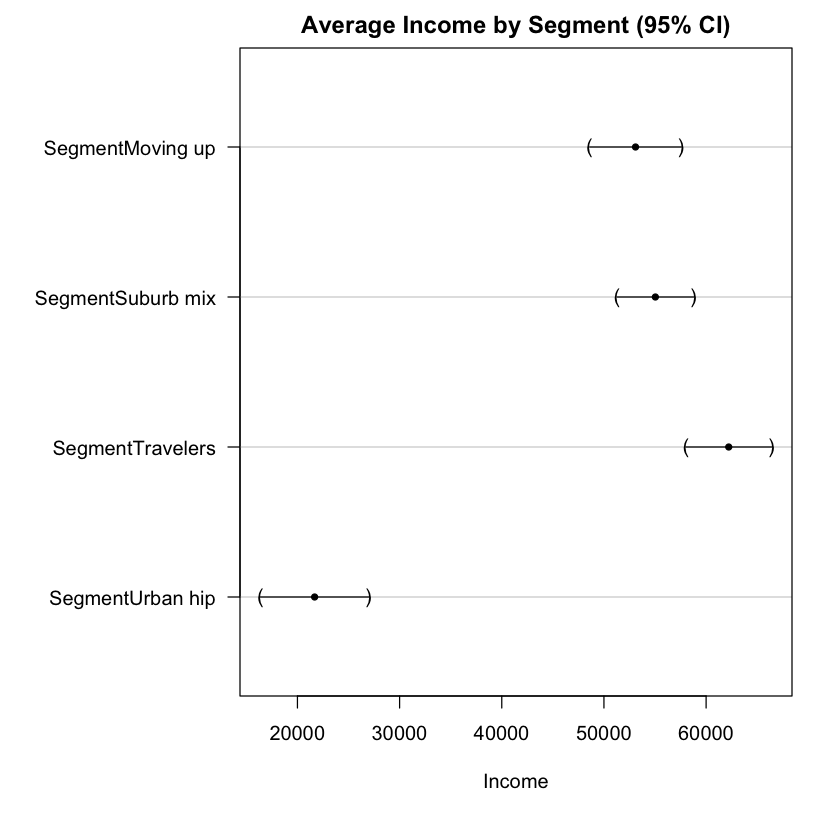

In [22]:
par(mar=c(6,10,2,2))
plot(glht(seg.aov), xlab="Income", main="Average Income by Segment (95% CI)")

### Variable Selection in ANOVA: Stepwise Modeling

The step() command uses the AIC to compare models on the basis of overall fit balanced with model complex- ity [3].

In [23]:
seg.aov.step <- step(aov(income ~ ., data=seg.df))

Start:  AIC=5779.17
income ~ age + gender + kids + ownHome + subscribe + Segment

            Df  Sum of Sq        RSS    AIC
- age        1 4.7669e+06 6.5661e+10 5777.2
- ownHome    1 1.0337e+08 6.5759e+10 5777.6
- kids       1 1.3408e+08 6.5790e+10 5777.8
- subscribe  1 1.5970e+08 6.5816e+10 5777.9
- gender     1 2.6894e+08 6.5925e+10 5778.4
<none>                    6.5656e+10 5779.2
- Segment    3 1.9303e+10 8.4959e+10 5850.5

Step:  AIC=5777.19
income ~ gender + kids + ownHome + subscribe + Segment

            Df  Sum of Sq        RSS    AIC
- ownHome    1 1.0159e+08 6.5762e+10 5775.7
- kids       1 1.3205e+08 6.5793e+10 5775.8
- subscribe  1 1.5794e+08 6.5819e+10 5775.9
- gender     1 2.7009e+08 6.5931e+10 5776.4
<none>                    6.5661e+10 5777.2
- Segment    3 4.9044e+10 1.1470e+11 5938.6

Step:  AIC=5775.66
income ~ gender + kids + subscribe + Segment

            Df  Sum of Sq        RSS    AIC
- kids       1 1.0707e+08 6.5869e+10 5774.1
- subscribe  1 1.6370e+08 6.

In [24]:
anova(seg.aov.step)

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
Segment,3,54969675428,18323225143,81.82841,1.409305e-38
Residuals,296,66281072794,223922543,NA,NA


Stepwise procedures are not a panacea and must be used with caution, although they are sometimes helpful for model exploration. In more general cases—where there may be dozens, hundreds, or thousands of available variables—variable selection is better informed by procedures such as a lasso [152] or random forest [19] procedure. We examine random forest models in Chap. 11.

### Basics of Bayesian ANOVA

In [25]:
set.seed(96761)
library(BayesFactor)
seg.bf1 <- lmBF(income ~ Segment, data=seg.df)

Loading required package: coda
Loading required package: Matrix
************
Welcome to BayesFactor 0.9.12-2. If you have questions, please contact Richard Morey (richarddmorey@gmail.com).

Type BFManual() to open the manual.
************


In [27]:
seg.bf2 <- lmBF(income ~ Segment + ownHome, data=seg.df)

In [28]:
seg.bf1 / seg.bf2

Bayes factor analysis
--------------
[1] Segment : 6.579729 ±1.62%

Against denominator:
  income ~ Segment + ownHome 
---
Bayes factor type: BFlinearModel, JZS


This tells us that the ratio of Bayes Factors for model 1 (∼ Segment) vs. model 2 (∼ Segment + ownHome) is 6.58. This means that model 1 is the preferable model by a factor of 6.5.

In [29]:
seg.bf.chain <- posterior(seg.bf1, 1, iterations = 10000)

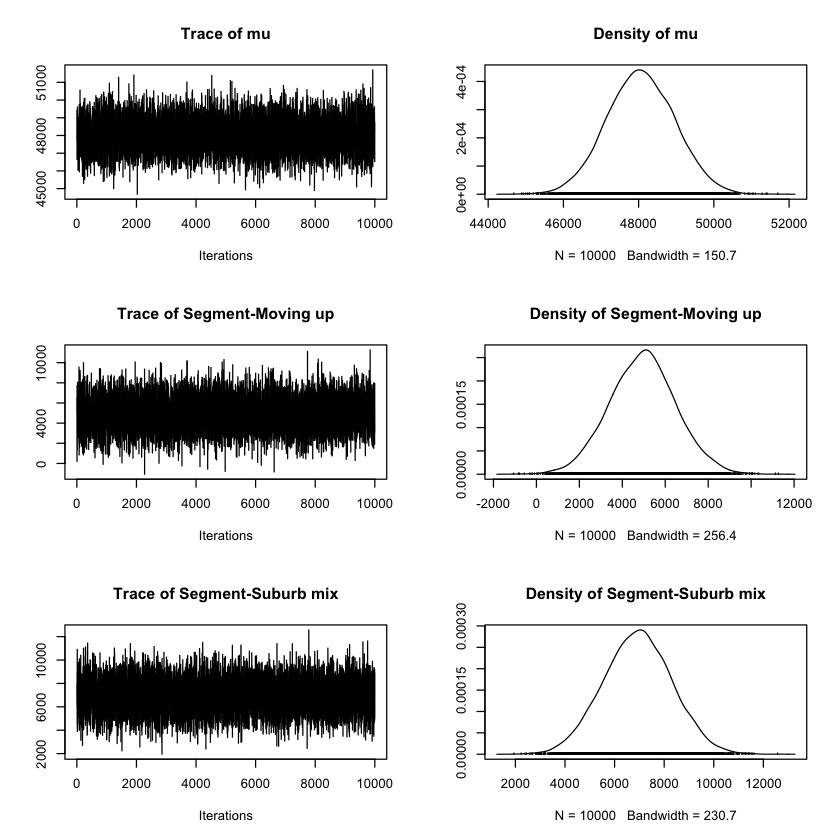

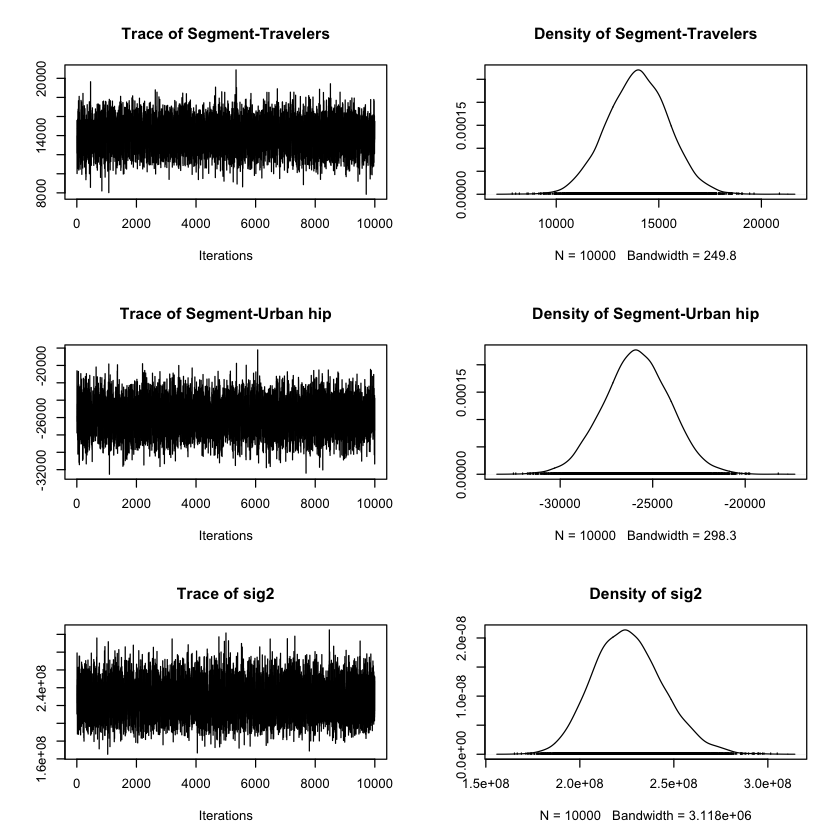

In [30]:
plot(seg.bf.chain[, 1:6]) 

We interpret the charts as follows. On the left, we see the estimated parameter values (Y axis) plotted against the draw sequence (X axis). These form a fat but straight line, which means the estimates varied around a stable central point; thus, they converged. (If they had not converged, the plot would show erratic variations up or down, or would spread out increasingly rather than being straight.)

On the right, we see a density plot of the values. The density shape is approximately normal, which matches the assumption of the regression model. Thus, the charts confirm that the model was stable and converged (note that these don’t mean the model is useful, only that it achieved a stable estimate).

In [31]:
summary(seg.bf.chain)


Iterations = 1:10000
Thinning interval = 1 
Number of chains = 1 
Sample size per chain = 10000 

1. Empirical mean and standard deviation for each variable,
   plus standard error of the mean:

                         Mean        SD  Naive SE Time-series SE
mu                  4.806e+04 8.969e+02 8.969e+00      8.804e+00
Segment-Moving up   4.951e+03 1.548e+03 1.548e+01      1.548e+01
Segment-Suburb mix  6.927e+03 1.373e+03 1.373e+01      1.373e+01
Segment-Travelers   1.398e+04 1.487e+03 1.487e+01      1.518e+01
Segment-Urban hip  -2.586e+04 1.777e+03 1.777e+01      1.956e+01
sig2                2.259e+08 1.856e+07 1.856e+05      1.856e+05
g_Segment           2.138e+00 3.359e+00 3.359e-02      3.359e-02

2. Quantiles for each variable:

                         2.5%        25%        50%        75%      97.5%
mu                  4.631e+04  4.745e+04  4.805e+04  4.868e+04  4.982e+04
Segment-Moving up   1.925e+03  3.916e+03  4.968e+03  5.961e+03  8.054e+03
Segment-Suburb mix  4.243e+0

In [32]:
head(seg.bf.chain)

Markov Chain Monte Carlo (MCMC) output:
Start = 1 
End = 7 
Thinning interval = 1 
           mu Segment-Moving up Segment-Suburb mix Segment-Travelers
[1,] 48055.75         4964.3105           6909.032          13983.21
[2,] 47706.52         6478.1497           7816.873          12160.32
[3,] 48362.90         5228.0718           6654.030          12565.87
[4,] 49417.43         5300.9543           7249.228          12218.89
[5,] 48177.21         6150.6339           6025.763          15589.03
[6,] 49440.51          186.6233           6259.676          14172.76
[7,] 46650.93         3530.4188           6921.267          14348.78
     Segment-Urban hip      sig2 g_Segment
[1,]         -25856.55 223195155 0.7316422
[2,]         -26455.34 242898723 1.0773890
[3,]         -24447.97 212407122 0.4827941
[4,]         -24769.08 210490536 5.9279560
[5,]         -27765.43 249129453 1.8348678
[6,]         -20619.06 249498924 2.8711583
[7,]         -24800.47 220446304 2.5618715

Note that the model estimates an overall mu that is the best guess for the population mean regardless of segment effects, and then estimates each segment as a deviation from that. 

In [33]:
seg.bf.chain.total <- seg.bf.chain[, 2:5] + seg.bf.chain[, 1]
seg.bf.ci <- t(apply(seg.bf.chain.total, 2, quantile, pr=c(0.025, 0.5, 0.975)))
seg.bf.ci

,2.5%,50%,97.5%
Segment-Moving up,49582.08,53020.98,56522.05
Segment-Suburb mix,52039.66,54988.99,57867.29
Segment-Travelers,58799.46,62048.33,65355.62
Segment-Urban hip,17992.85,22216.26,26450.56


In [34]:
library(ggplot2)
seg.bf.df <- data.frame(seg.bf.ci)
seg.bf.df$Segment <- rownames(seg.bf.df)

Warning message:
: package ‘ggplot2’ was built under R version 3.2.3

In [35]:
seg.bf.df

,X2.5.,X50.,X97.5.,Segment
Segment-Moving up,49582.08,53020.98,56522.05,Segment-Moving up
Segment-Suburb mix,52039.66,54988.99,57867.29,Segment-Suburb mix
Segment-Travelers,58799.46,62048.33,65355.62,Segment-Travelers
Segment-Urban hip,17992.85,22216.26,26450.56,Segment-Urban hip


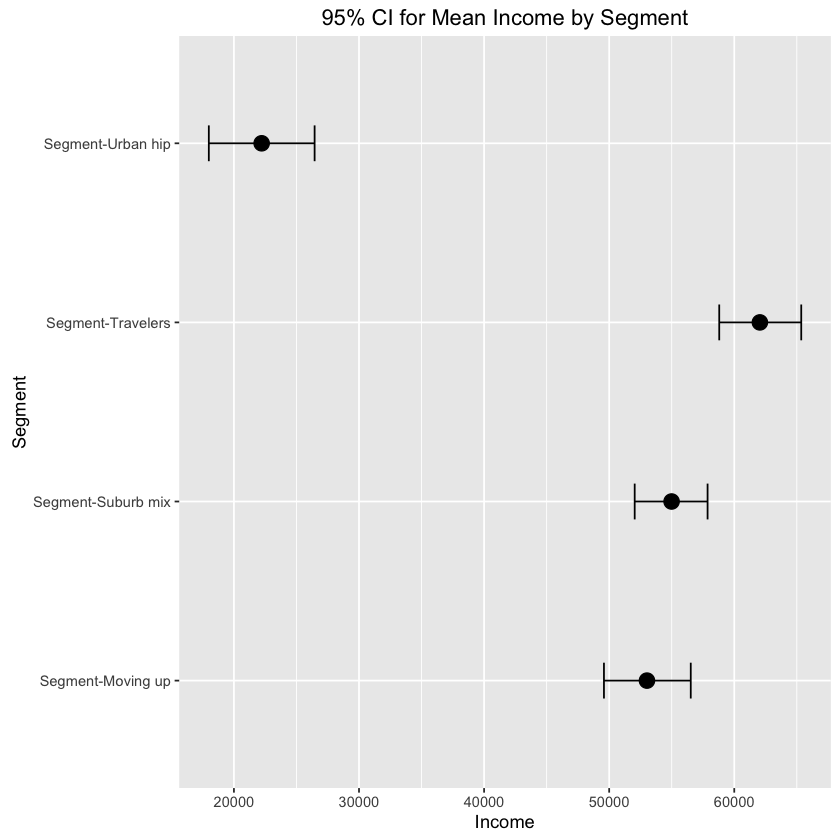

In [36]:
ggplot(seg.bf.df, aes(x=Segment, y=X50., ymax=X97.5., ymin=X2.5.)) + 
geom_point(size=4) + geom_errorbar(width=0.2) + ylab("Income") +
ggtitle("95% CI for Mean Income by Segment") + coord_flip()

- R Companion to Applied Regression
- An Introduction to Categorical Data Analysis
- Doing Bayesian Data Analysis
- Bayesian Data Analysis
- Bayesian Statistics and Marketing

To perform statistical tests on differences by group:
- chisq.test() (Sect. 6.2) and binom.test() (Sect. 6.3) find confidence intervals and perform hypothesis tests on tables and proportion data, respec- tively. The binom package offers options such as Agresti–Coull and Bayesian versions of binomial tests that may be more informative and robust than stan- dard exact binomial tests (Sect. 6.3).
- A t.test() is a common way to test for differences between the means of two groups (or between one group and a fixed value) (Sect. 6.4).
- ANOVA is a more general way to test for differences in mean among sev- eral groups that are identified by one or more factors. The basic model is fit with aov() and common summary statistics are reported with anova() (Sect. 6.5).
- The anova() command is also useful to compare two or more ANOVA or other linear models, provided that they are nested models (Sect. 6.5.1).
- Stepwise model selection with step() is one way to evaluate a list of vari- ables to select a well-fitting model, although we recommend that it be used with caution as other procedures may be more appropriate (Sect. 6.5.3).

We reviewed a few advanced topics for statistical models and data visualiza- tion:
- Plotting a glht() object from the multcomp package is a good way to visu- alize confidence intervals for ANOVA models (Sect. 6.5.2).
- A relatively straightforward starting point for Bayesian ANOVA and other lin- ear models is the BayesFactor package (Sect. 6.6).
- Bayesian models should be evaluated for the stability and distribution of their estimated parameters using trace and density plots (Sect. 6.6).
- Credible intervals (and other types of intervals) may be plotted with the ggplot2 option to add geom errorbar() lines for groups (Sect. 6.6.4).